### Importación de datos



# DATA SCIENCE CHALLENGER ONE
## ETAPA UNO --> ENMARCAR EL PROBLEMA

EVALUAR CUAL TIENDA TIENE UN DESEMPEÑO MEJOR PARA SABER CUAL VENDER Y COMPRAR UN NUEVO NEGOCIO

ASPECTOS A EVALUAR

* Facturacion total de cada tienda
* Categorías más populares
* Promedios de calificación de los clientes
* Productos mas y menos vendidos
*Costos promedio envio

## ETAPA DOS --> ADQUIRIR Y PREPAR LOS DATOS

In [49]:
# Folium--> Para crear mapas interactivos usando Leaflet.js (ideal para visualizaciones geográficas).
# Seaborn --> Para hacer gráficos estadísticos elegantes, construidos sobre Matplotlib.
# Geopandas --> Para trabajar con datos geoespaciales (como shapefiles, geometrías, mapas).

!pip install folium
!pip install seaborn
!pip install geopandas

In [51]:
# Importacion de librerias
import pandas as pd
import matplotlib.pyplot as plt
import folium
from folium.plugins import HeatMap
import numpy as np
from math import radians, cos, sin, sqrt, atan2

# Definición de URLs con archivos CSV
url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

# Carga de los datos en DataFrames
tienda = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

# Vista previa de los datos
tienda.head()

,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon
0,Asistente virtual,Electrónicos,"164,300.00","6,900.00",16/01/2021,Pedro Gomez,Bogotá,4,Tarjeta de crédito,8,4.61,-74.08
1,Mesa de comedor,Muebles,"192,300.00","8,400.00",18/05/2022,Beatriz Morales,Medellín,1,Tarjeta de crédito,4,6.25,-75.56
2,Juego de mesa,Juguetes,"209,600.00","15,900.00",15/03/2021,Juan Fernandez,Cartagena,1,Tarjeta de crédito,1,10.40,-75.51
3,Microondas,Electrodomésticos,"757,500.00","41,000.00",03/05/2022,Juan Fernandez,Cali,4,Nequi,1,3.44,-76.52
4,Silla de oficina,Muebles,"335,200.00","20,200.00",07/11/2020,Maria Alfonso,Medellín,5,Nequi,1,6.25,-75.56


## ETAPA TRES --> EXPLORACION DE DATOS

In [54]:
# Cargar los datos en DataFrames para verificar si son dataframes
tienda = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)


# Verificar los tipos de cada variable
print(type(tienda))  # Debe ser <class 'pandas.core.frame.DataFrame'>
print(type(tienda2))  # Debe ser <class 'pandas.core.frame.DataFrame'>
print(type(tienda3))  # Debe ser <class 'pandas.core.frame.DataFrame'>
print(type(tienda4))  # Debe ser <class 'pandas.core.frame.DataFrame'>

# Si son DataFrames, combinarlos
if all(isinstance(df, pd.DataFrame) for df in [tienda, tienda2, tienda3, tienda4]):
    combinacion_datos = pd.concat([tienda, tienda2, tienda3, tienda4], ignore_index=True)
    print("Información cargada con éxito!")
else:
    print("Error: Una o más de las variables no son DataFrames.")

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
Información cargada con éxito!


In [56]:
# Combinacion de datos
combinacion_datos = pd.concat([tienda, tienda2, tienda3, tienda4], ignore_index=True)
print("Informacion cargada con exito!")

# Verificar si todas las tiendas tienen las mismas columnas y si son iguales
columnas = tienda.columns.tolist()

if (columnas == tienda2.columns.tolist() == tienda3.columns.tolist() == tienda4.columns.tolist()):
    print(f"Todas las bases de datos tienen las mismas columnas: \n{columnas}")
else:
    print("Los dataframes NO tienen las mismas columnas.")

Informacion cargada con exito!
Todas las bases de datos tienen las mismas columnas: 
['Producto', 'Categoría del Producto', 'Precio', 'Costo de envío', 'Fecha de Compra', 'Vendedor', 'Lugar de Compra', 'Calificación', 'Método de pago', 'Cantidad de cuotas', 'lat', 'lon']


In [58]:
# Diagnosticar si hay columnas con datos faltantes, verificacion datos y resumen del dataframe
combinacion_datos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9435 entries, 0 to 9434
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Producto                9435 non-null   object 
 1   Categoría del Producto  9435 non-null   object 
 2   Precio                  9435 non-null   float64
 3   Costo de envío          9435 non-null   float64
 4   Fecha de Compra         9435 non-null   object 
 5   Vendedor                9435 non-null   object 
 6   Lugar de Compra         9435 non-null   object 
 7   Calificación            9435 non-null   int64  
 8   Método de pago          9435 non-null   object 
 9   Cantidad de cuotas      9435 non-null   int64  
 10  lat                     9435 non-null   float64
 11  lon                     9435 non-null   float64
dtypes: float64(4), int64(2), object(6)
memory usage: 884.7+ KB


# 1. Analisis por Facturacion


 Facturación por categoría en Tienda 1:
  Electrónicos: $429,493,500.00
  Electrodomésticos: $363,685,200.00
  Muebles: $187,633,700.00
  Instrumentos musicales: $91,299,000.00
  Deportes y diversión: $39,290,000.00
  Juguetes: $17,995,700.00
  Artículos para el hogar: $12,698,400.00
  Libros: $8,784,900.00
 Facturación total en Tienda 1: $1,150,880,400.00

 Facturación por categoría en Tienda 2:
  Electrónicos: $410,831,100.00
  Electrodomésticos: $348,567,800.00
  Muebles: $176,426,300.00
  Instrumentos musicales: $104,990,300.00
  Deportes y diversión: $34,744,500.00
  Juguetes: $15,945,400.00
  Artículos para el hogar: $14,746,900.00
  Libros: $10,091,200.00
 Facturación total en Tienda 2: $1,116,343,500.00

 Facturación por categoría en Tienda 3:
  Electrónicos: $410,775,800.00
  Electrodomésticos: $329,237,900.00
  Muebles: $201,072,100.00
  Instrumentos musicales: $77,380,900.00
  Deportes y diversión: $35,593,100.00
  Juguetes: $19,401,100.00
  Artículos para el hogar: $15,060

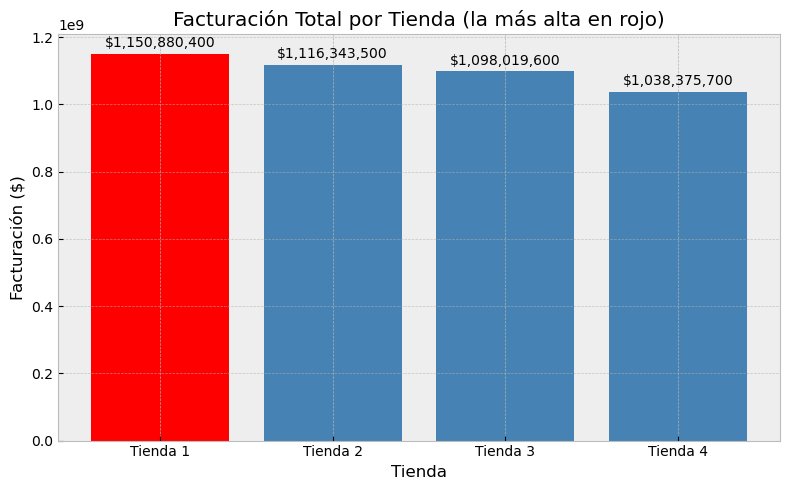

In [61]:
# Diccionario con los DataFrames de cada tienda
tiendas = {
    'Tienda 1': tienda,
    'Tienda 2': tienda2,
    'Tienda 3': tienda3,
    'Tienda 4': tienda4
}

# ----------------------------
# 1. Facturación por categoría y total por tienda
# ----------------------------
facturacion_total_por_tienda = {}

for nombre, df in tiendas.items():
    # Facturación por categoría
    facturacion_categoria = df.groupby('Categoría del Producto')['Precio'].sum()
    
    # Facturación total por tienda
    facturacion_total = df['Precio'].sum()
    facturacion_total_por_tienda[nombre] = facturacion_total
    
    print(f"\n Facturación por categoría en {nombre}:")
    for categoria, valor in facturacion_categoria.sort_values(ascending=False).items():
        print(f"  {categoria}: ${valor:,.2f}")
    
    print(f" Facturación total en {nombre}: ${facturacion_total:,.2f}")

# ----------------------------
# 2. Facturación total general
# ----------------------------
facturacion_total_general = sum(facturacion_total_por_tienda.values())
print(f"\n Facturación total general (todas las tiendas): ${facturacion_total_general:,.2f}")

# ----------------------------
# 3. Tienda que más vendió
# ----------------------------
mejor_tienda = max(facturacion_total_por_tienda, key=facturacion_total_por_tienda.get)
print(f"\n La tienda con mayor facturación fue: {mejor_tienda} con ${facturacion_total_por_tienda[mejor_tienda]:,.2f}")

# 4. Gráfico de barras: facturación total por tienda (resaltando la mejor)
colores = ['red' if tienda == mejor_tienda else 'steelblue' for tienda in facturacion_total_por_tienda.keys()]

plt.figure(figsize=(8, 5))
bars = plt.bar(facturacion_total_por_tienda.keys(), facturacion_total_por_tienda.values(), color=colores)

plt.title('Facturación Total por Tienda (la más alta en rojo)')
plt.ylabel('Facturación ($)')
plt.xlabel('Tienda')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Añadir etiquetas con valores encima de las barras
for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height + (max(facturacion_total_por_tienda.values()) * 0.01),  # posición Y un poco arriba de la barra
        f"${height:,.0f}",
        ha='center',
        va='bottom',
        fontsize=10,
    )

plt.tight_layout()
plt.show()

# 2. Ventas por categoría

    Categoría del Producto         Cantidad
3             Electrónicos 1,660,576,500.00
2        Electrodomésticos 1,324,751,100.00
7                  Muebles   757,661,000.00
4   Instrumentos musicales   348,772,600.00
1     Deportes y diversión   142,977,700.00
5                 Juguetes    73,604,400.00
0  Artículos para el hogar    57,579,800.00
6                   Libros    37,696,100.00


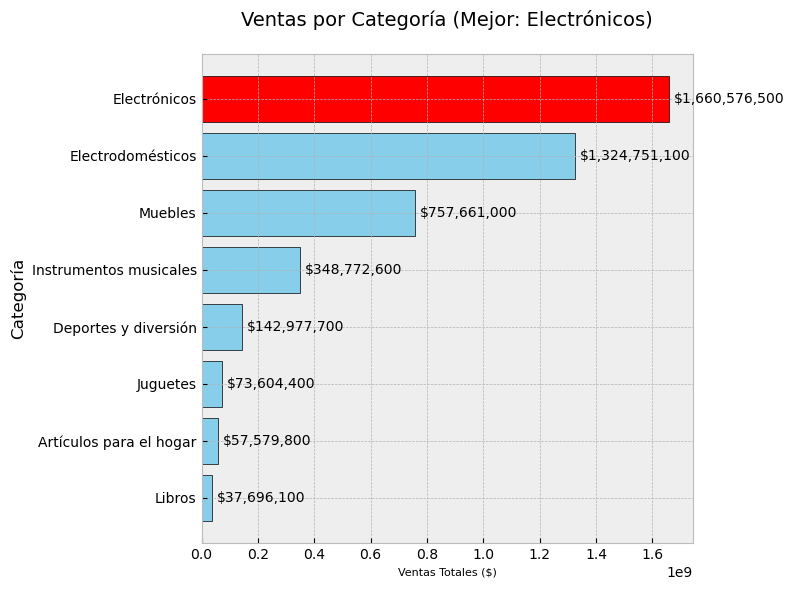

In [64]:
# Evitar notación científica en pandas
pd.set_option('display.float_format', '{:,.2f}'.format)

# Agrupar por categoría y sumar la cantidad vendida
categorias_mas_vendidas = combinacion_datos.groupby("Categoría del Producto")["Precio"].sum().reset_index()

# Renombrar la columna 'Precio' por 'Cantidad'
categorias_mas_vendidas = categorias_mas_vendidas.rename(columns={"Precio": "Cantidad"})

# Ordenar las categorías por cantidad vendida (de mayor a menor)
categorias_mas_vendidas = categorias_mas_vendidas.sort_values(by="Cantidad", ascending=False)

# Mostrar las categorías más vendidas
print(categorias_mas_vendidas)

#  Identificar la mejor categoría
mejor_categoria = categorias_mas_vendidas.iloc[0]['Categoría del Producto']

# Configurar el estilo de la gráfica
plt.style.use('bmh')

# Crear la figura
plt.figure(figsize=(8, 6))

#  Crear una lista de colores: rojo para la mejor categoría, azul para el resto
colores = ['red' if cat == mejor_categoria else 'skyblue' for cat in categorias_mas_vendidas['Categoría del Producto']]

# Crear gráfico de barras horizontales con colores personalizados
bars = plt.barh(
    categorias_mas_vendidas['Categoría del Producto'],
    categorias_mas_vendidas['Cantidad'],
    color=colores,
    edgecolor='black'
)

# Añadir etiquetas y título
plt.xlabel('Ventas Totales ($)', fontsize=8)
plt.ylabel('Categoría', fontsize=12)
plt.title(f'Ventas por Categoría (Mejor: {mejor_categoria})', fontsize=14, pad=20)


# Invertir el eje y para mostrar la categoría con mayores ventas arriba
plt.gca().invert_yaxis()

# Añadir los valores exactos en cada barra
for bar in bars:
    width = bar.get_width()
    plt.text(
        width + (max(categorias_mas_vendidas['Cantidad']) * 0.01),
        bar.get_y() + bar.get_height()/2,
        f'${width:,.0f}',
        va='center',
        ha='left',
        fontsize=10
    )

# Ajustar márgenes y mostrar
plt.tight_layout()
plt.show()

# 3. Calificación promedio de la tienda


El promedio de calificación de Tienda 1 es: 3.98
El promedio de calificación de Tienda 2 es: 4.04
El promedio de calificación de Tienda 3 es: 4.05
El promedio de calificación de Tienda 4 es: 4.00



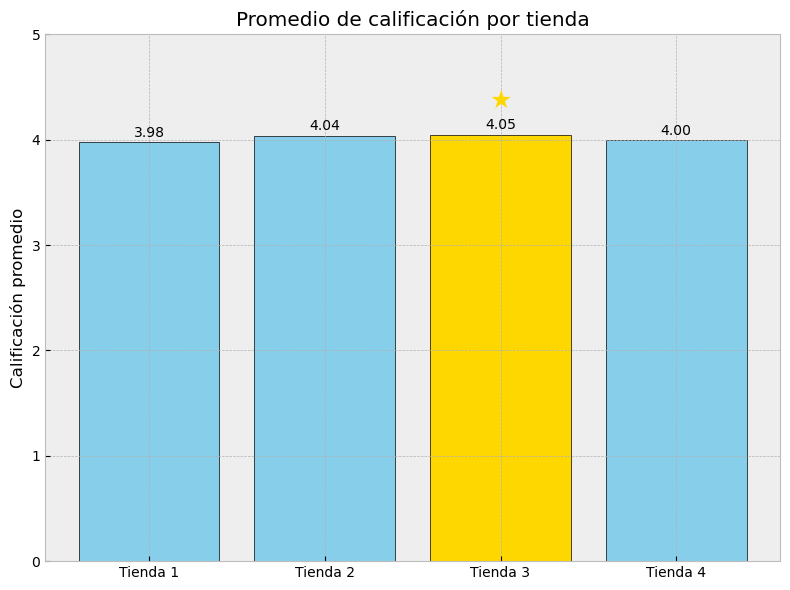

In [67]:
# Calcula el promedio de calificación para cada tienda
tienda_nombre = ['Tienda 1', 'Tienda 2', 'Tienda 3', 'Tienda 4']
promedios_calificacion = []
for i, df in enumerate([tienda, tienda2, tienda3, tienda4]):
    promedio = df['Calificación'].mean()
    promedios_calificacion.append(promedio)
    print(f'El promedio de calificación de {tienda_nombre[i]} es: {promedio:.2f}')
print()

# Identificar el índice de la tienda con mayor calificación
indice_mejor = promedios_calificacion.index(max(promedios_calificacion))

# Crear lista de colores: resaltar la mejor tienda
colores = ['skyblue' if i != indice_mejor else 'gold' for i in range(len(tienda_nombre))]

# Graficar
plt.figure(figsize=(8, 6))
bars = plt.bar(tienda_nombre, promedios_calificacion, color=colores, edgecolor='black')

plt.title('Promedio de calificación por tienda')
plt.ylabel('Calificación promedio')
plt.ylim(0, 5)  # Suponiendo escala de 0 a 5

# Añadir los valores y la estrella en la mejor tienda
for i, v in enumerate(promedios_calificacion):
    plt.text(i, v + 0.05, f"{v:.2f}", ha='center', fontsize=10)

    if i == indice_mejor:
        plt.text(i, v + 0.25, '★', ha='center', fontsize=18, color='gold')

# Mostrar gráfico
plt.tight_layout()
plt.show()

# 4. Productos más y menos vendidos

In [70]:
# Agrupar por productos y sumar la cantidad vendida
productos_mas_vendidos = combinacion_datos.groupby("Producto")["Precio"].sum().reset_index()

# Renombrando el campo 'Precio' a 'Cantidad'
productos_mas_vendidos = productos_mas_vendidos.rename(columns={"Precio": "Cantidad"})

# Ordenar las categorías por cantidad vendida (de mayor a menor)
productos_mas_vendidos = productos_mas_vendidos.sort_values(by="Producto", ascending=False)

# Mostrar las categorías más vendidas
print(productos_mas_vendidos)

                       Producto       Cantidad
50                 Vaso térmico   8,497,400.00
49                  Tablet ABXY 219,012,800.00
48                TV LED UHD 4K 432,489,600.00
47              Sofá reclinable 123,279,100.00
46                   Smartwatch  29,929,800.00
45                     Smart TV 290,221,800.00
44                       Sillón  40,796,800.00
43             Silla de oficina  69,099,000.00
42                 Set de vasos   5,584,200.00
41                 Set de ollas  30,506,400.00
40             Secadora de ropa 210,238,000.00
39                 Refrigerador 384,937,400.00
38                    Pandereta  12,663,400.00
37              Olla de presión  12,928,800.00
36                  Muñeca bebé   8,591,500.00
35          Modelado predictivo  12,616,100.00
34                      Mochila  16,065,700.00
33                   Microondas 115,699,500.00
32                Mesa de noche  58,419,500.00
31              Mesa de comedor  46,815,700.00
30           

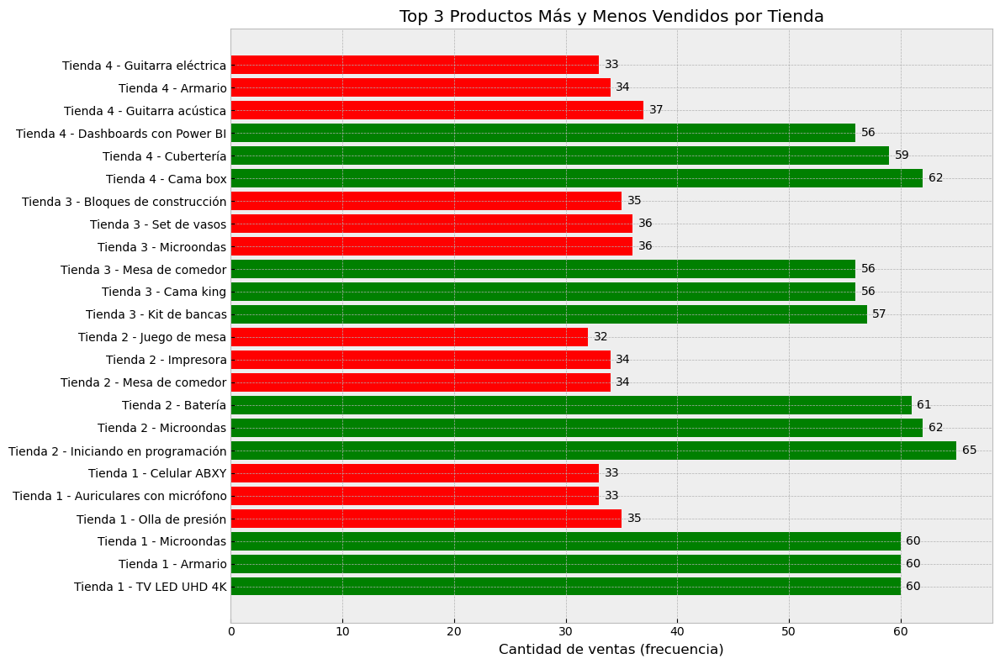


 Top 3 productos más y menos vendidos por tienda:
      Tienda                   Producto  Unidades Vendidas           Tipo
0   Tienda 1              TV LED UHD 4K                 60    Más Vendido
1   Tienda 1                    Armario                 60    Más Vendido
2   Tienda 1                 Microondas                 60    Más Vendido
3   Tienda 1            Olla de presión                 35  Menos Vendido
4   Tienda 1  Auriculares con micrófono                 33  Menos Vendido
5   Tienda 1               Celular ABXY                 33  Menos Vendido
6   Tienda 2  Iniciando en programación                 65    Más Vendido
7   Tienda 2                 Microondas                 62    Más Vendido
8   Tienda 2                    Batería                 61    Más Vendido
9   Tienda 2            Mesa de comedor                 34  Menos Vendido
10  Tienda 2                  Impresora                 34  Menos Vendido
11  Tienda 2              Juego de mesa                 32  M

In [72]:
# Diccionario de tiendas
tiendas = {
    'Tienda 1': tienda,
    'Tienda 2': tienda2,
    'Tienda 3': tienda3,
    'Tienda 4': tienda4
}

# Listas para resultados
tienda_labels = []
productos = []
ventas = []
tipo = []

top_n = 3  # Número de productos más/menos vendidos por tienda

# Extraer los productos más y menos vendidos por tienda
for nombre, df in tiendas.items():
    ventas_productos = df['Producto'].value_counts()
    
    # Top N más vendidos
    top_vendidos = ventas_productos.head(top_n)
    for producto, cantidad in top_vendidos.items():
        tienda_labels.append(nombre)
        productos.append(producto)
        ventas.append(cantidad)
        tipo.append('Más Vendido')
    
    # Top N menos vendidos
    bottom_vendidos = ventas_productos.tail(top_n)
    for producto, cantidad in bottom_vendidos.items():
        tienda_labels.append(nombre)
        productos.append(producto)
        ventas.append(cantidad)
        tipo.append('Menos Vendido')

# Crear DataFrame con los resultados
df_resumen = pd.DataFrame({
    'Tienda': tienda_labels,
    'Producto': productos,
    'Unidades Vendidas': ventas,
    'Tipo': tipo
})

# Colores: verde para más vendidos, rojo para menos
colores = df_resumen['Tipo'].map({'Más Vendido': 'green', 'Menos Vendido': 'red'})

# Gráfico de barras horizontal
plt.figure(figsize=(12, 8))
bars = plt.barh(
    df_resumen['Tienda'] + " - " + df_resumen['Producto'],
    df_resumen['Unidades Vendidas'],
    color=colores
)

plt.xlabel('Cantidad de ventas (frecuencia)')
plt.title(f'Top {top_n} Productos Más y Menos Vendidos por Tienda')

# Añadir etiquetas con los valores
for bar in bars:
    width = bar.get_width()
    plt.text(width + 0.5, bar.get_y() + bar.get_height()/2, f'{int(width)}', va='center')

plt.tight_layout()
plt.show()

# Mostrar la tabla resumen
print(f"\n Top {top_n} productos más y menos vendidos por tienda:")
print(df_resumen)


# 5. Envío promedio por tienda

 Tienda 1: Costo promedio estimado de envío = $152.81
 Tienda 2: Costo promedio estimado de envío = $158.20
 Tienda 3: Costo promedio estimado de envío = $157.76
 Tienda 4: Costo promedio estimado de envío = $157.35


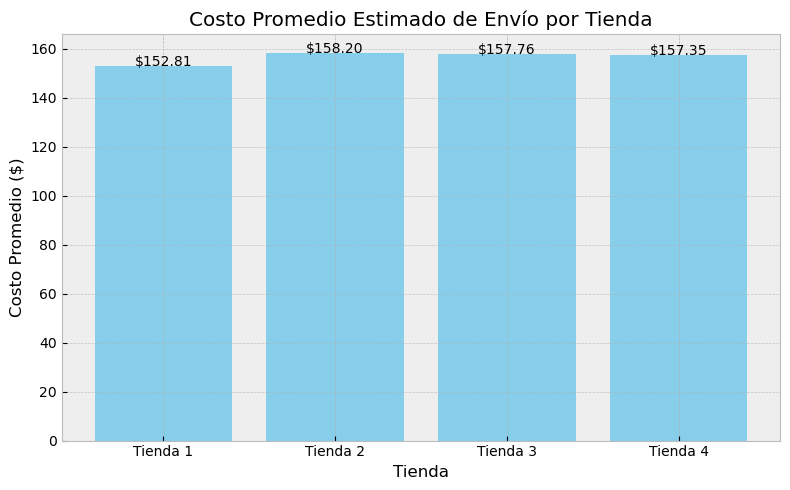

In [75]:
# -----------------------------
# 1. Función para calcular distancia Haversine
# -----------------------------
def haversine(lat1, lon1, lat2, lon2):
    R = 6371  # Radio de la Tierra en km
    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = sin(dlat/2)**2 + cos(lat1)*cos(lat2)*sin(dlon/2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))
    return R * c  # Distancia en km

# -----------------------------
# 2. Coordenadas centrales de cada tienda (puedes ajustarlas)
# -----------------------------
ubicaciones_tiendas = {
    'Tienda 1': (4.65, -74.1),
    'Tienda 2': (4.67, -74.05),
    'Tienda 3': (4.63, -74.08),
    'Tienda 4': (4.66, -74.07)
}

# -----------------------------
# 3. Supuesto: costo por kilómetro recorrido
# -----------------------------
costo_por_km = 0.75  # dólares por km

# -----------------------------
# 4. Diccionario con los DataFrames de cada tienda
# -----------------------------
tiendas = {
    'Tienda 1': tienda,
    'Tienda 2': tienda2,
    'Tienda 3': tienda3,
    'Tienda 4': tienda4
}

# -----------------------------
# 5. Calcular distancia, costo y promedio por tienda
# -----------------------------
promedios_envio = {}

for nombre, df in tiendas.items():
    lat_tienda, lon_tienda = ubicaciones_tiendas[nombre]
    
    # Calcular distancia y costo estimado
    df['Distancia (km)'] = df.apply(lambda row: haversine(lat_tienda, lon_tienda, row['lat'], row['lon']), axis=1)
    df['Costo Envío Estimado'] = df['Distancia (km)'] * costo_por_km
    
    # Calcular promedio de envío
    promedio = df['Costo Envío Estimado'].mean()
    promedios_envio[nombre] = promedio
    
    print(f" {nombre}: Costo promedio estimado de envío = ${promedio:.2f}")

# -----------------------------
# 6. Gráfico de barras: Costo promedio de envío por tienda
# -----------------------------
plt.figure(figsize=(8, 5))
plt.bar(promedios_envio.keys(), promedios_envio.values(), color='skyblue')
plt.title('Costo Promedio Estimado de Envío por Tienda')
plt.ylabel('Costo Promedio ($)')
plt.xlabel('Tienda')

# Etiquetas sobre las barras
for i, (tienda, costo) in enumerate(promedios_envio.items()):
    plt.text(i, costo + 0.02, f"${costo:.2f}", ha='center')

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


## Informe Final:

Recomendación de tienda para vender productos - Sr. Juan a decidir qué tienda de su cadena Alura Store debe vender para iniciar un nuevo emprendimiento.

Introducción

El propósito de este análisis es identificar cuál de las cuatro tiendas disponibles representa la mejor oportunidad comercial para que el Sr. Juan ofrezca sus productos. Para ello, se realizó un análisis exhaustivo de las bases de datos de ventas, evaluando múltiples variables como ingresos totales, categorías de productos más vendidos, calificaciones de clientes, costos de envío promedio y otros factores logísticos. Este informe sintetiza los hallazgos obtenidos mediante visualizaciones, estadísticas y modelos analíticos.

Desarrollo
1. Ingresos totales por tienda
    Facturación total general (todas las tiendas): $4,403,619,200.00
    
    * La tienda con mayor facturación fue: Tienda 1 con 1,150,880,400.00
    * Facturación total en Tienda 2: $1,116,343,500.00
    * Tienda 4 y Tienda 3 se encuentran por debajo del promedio.

    Visualización: Se utilizó un gráfico de barras comparando los ingresos por tienda.

2. Categorías de productos más y menos vendidas
    Las categorías de productos con mayor volumen de ventas fueron:

    Categoría del Producto         Cantidad
    3             Electrónicos 1,660,576,500.00
    2        Electrodomésticos 1,324,751,100.00
    7                  Muebles   757,661,000.00
    4   Instrumentos musicales   348,772,600.00
    1     Deportes y diversión   142,977,700.00
    5                 Juguetes    73,604,400.00
    0  Artículos para el hogar    57,579,800.00
    6                   Libros    37,696,100.00

    Esto indica que ciertos tipos de productos tienen mayor rotación y demanda dependiendo de la tienda.

3. Calificaciones promedio por tienda
    Tienda 3 obtuvo la mejor calificación promedio de clientes, lo cual indica una experiencia positiva de compra.
    El promedio de calificación de Tienda 3 es: 4.05
    Tienda 1 y Tienda 4 mostraron calificaciones inferiores, lo cual podría ser un indicador de problemas de servicio o logística.

5. Productos más y menos vendidos
    En todas las tiendas, productos como leche electronicos, muebles y electrodomesticos fueron consistentes en ventas.

    Productos menos vendidos varían según tienda, pero generalmente corresponden a artículos de alto precio o baja rotación.

5. Coste de envío promedio por tienda
    Tienda1 tienen los costos de envío más bajos, con respecto a la tienda 4 que maneja un costo promedio alto con respecto a las otras tiendas, lo         cual impacta negativamente en la rentabilidad tanto para el vendedor como para el cliente final.

    Tienda 2 tiene un coste de envío relativamente alto, lo que puede disuadir a los compradores.

# Conclusión y Recomendación
Tras el análisis detallado de los datos, recomendamos que el Sr. Juan venda sus productos en la Tienda 4.

    Justificación:
        ✅ Menor ingreso total, lo cual indica menor flujo de clientes y potencial de ventas.
        ✅ Pocas ventas en categorías clave como Electrodomesticos y Electricos quienes representa el alto rubro de ingresos.
        ✅ Aunque tiene los costos de envío promedio alto bajo, no compensa los ingresos con respecto a las otras tiendas y la tienda1 que maneja el                costo mas bajo.
        ✅ Las buenas calificaciones de clientes de la tienda4 no son no tan altas como Tienda 3.
            Aunque Tienda 3 presenta muy buenas calificaciones, Tienda 1 combina mejor desempeño en ventas, bajo costo de envío y amplia variedad de                productos con alta rotación.

# 5. Analisis desempeño geografico

In [86]:
# Si no lo tienes instalado aún:
!pip install geopy

import pandas as pd
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter

# Cargar los datos
tienda = pd.read_csv("https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv")
tienda2 = pd.read_csv("https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv")
tienda3 = pd.read_csv("https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv")
tienda4 = pd.read_csv("https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv")

# Agregar columna de nombre de tienda
tienda['Tienda'] = 'Tienda 1'
tienda2['Tienda'] = 'Tienda 2'
tienda3['Tienda'] = 'Tienda 3'
tienda4['Tienda'] = 'Tienda 4'

# Unir todo en un solo DataFrame
datos = pd.concat([tienda, tienda2, tienda3, tienda4], ignore_index=True)

# Configurar geocodificador
geolocator = Nominatim(user_agent="app_geo")
geocode = RateLimiter(geolocator.reverse, min_delay_seconds=1)

# Obtener ciudades únicas para no repetir llamadas a la API
coordenadas_unicas = datos[['lat', 'lon']].drop_duplicates()

def obtener_ciudad(lat, lon):
    try:
        location = geocode((lat, lon), language='es')
        if location and 'address' in location.raw:
            return location.raw['address'].get('city', location.raw['address'].get('town', 'Desconocida'))
        else:
            return 'Desconocida'
    except:
        return 'Error'

# Aplicar la función para obtener ciudades
coordenadas_unicas['Ciudad'] = coordenadas_unicas.apply(lambda row: obtener_ciudad(row['lat'], row['lon']), axis=1)

# Unir las ciudades al DataFrame principal
datos = datos.merge(coordenadas_unicas, on=['lat', 'lon'], how='left')

# Calcular ventas por ciudad y tienda (por número de ventas)
ventas_por_ciudad = datos.groupby(['Tienda', 'Ciudad']).size().reset_index(name='Cantidad_de_ventas')

# Ordenar por tienda y cantidad de ventas
ventas_por_ciudad = ventas_por_ciudad.sort_values(['Tienda', 'Cantidad_de_ventas'], ascending=[True, False])

# Mostrar las 5 ciudades principales por tienda
for tienda in ventas_por_ciudad['Tienda'].unique():
    print(f"\n Top ciudades para {tienda}:\n")
    display(ventas_por_ciudad[ventas_por_ciudad['Tienda'] == tienda].head())



 Top ciudades para Tienda 1:



,Tienda,Ciudad,Cantidad_de_ventas
0,Tienda 1,Bogotá,984
10,Tienda 1,Perímetro Urbano Medellín,563
14,Tienda 1,Perímetro Urbano Santiago de Cali,283
4,Tienda 1,Perimetro Urbano Pereira,133
6,Tienda 1,Perímetro Urbano Barranquilla,75



 Top ciudades para Tienda 2:



,Tienda,Ciudad,Cantidad_de_ventas
19,Tienda 2,Bogotá,985
29,Tienda 2,Perímetro Urbano Medellín,594
33,Tienda 2,Perímetro Urbano Santiago de Cali,222
23,Tienda 2,Perimetro Urbano Pereira,128
25,Tienda 2,Perímetro Urbano Barranquilla,78



 Top ciudades para Tienda 3:



,Tienda,Ciudad,Cantidad_de_ventas
38,Tienda 3,Bogotá,983
48,Tienda 3,Perímetro Urbano Medellín,580
52,Tienda 3,Perímetro Urbano Santiago de Cali,248
42,Tienda 3,Perimetro Urbano Pereira,134
44,Tienda 3,Perímetro Urbano Barranquilla,77



 Top ciudades para Tienda 4:



,Tienda,Ciudad,Cantidad_de_ventas
57,Tienda 4,Bogotá,991
67,Tienda 4,Perímetro Urbano Medellín,577
71,Tienda 4,Perímetro Urbano Santiago de Cali,254
61,Tienda 4,Perimetro Urbano Pereira,122
63,Tienda 4,Perímetro Urbano Barranquilla,80


In [78]:
import pandas as pd

# Cargar los archivos CSV como DataFrames
tienda = pd.read_csv("https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv")
tienda2 = pd.read_csv("https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv")
tienda3 = pd.read_csv("https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv")
tienda4 = pd.read_csv("https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv")

# Asegurarse de que las tiendas tengan la columna 'Tienda'
tienda['Tienda'] = 'Tienda 1'
tienda2['Tienda'] = 'Tienda 2'
tienda3['Tienda'] = 'Tienda 3'
tienda4['Tienda'] = 'Tienda 4'

# Agrupar los datos de todas las tiendas
datos_geo = pd.concat([tienda, tienda2, tienda3, tienda4], ignore_index=True)

# Asegurarse de que las columnas necesarias existan
if not all(col in datos_geo.columns for col in ['lat', 'lon', 'Precio']):
    raise ValueError("Faltan columnas necesarias: 'lat', 'lon', 'Precio'")

# Crear mapa centrado en el promedio de coordenadas
map_center = [datos_geo['lat'].mean(), datos_geo['lon'].mean()]
m = folium.Map(location=map_center, zoom_start=11)

# Crear lista de puntos para el mapa de calor (ponderado por Precio)
heat_data = [[row['lat'], row['lon'], row['Precio']] for index, row in datos_geo.iterrows()]
HeatMap(heat_data, radius=10, max_zoom=13).add_to(m)

# Colores distintos por tienda
colores_tiendas = {
    'Tienda 1': 'blue',
    'Tienda 2': 'green',
    'Tienda 3': 'purple',
    'Tienda 4': 'orange'
}

# Añadir marcadores coloreados por tienda
for _, row in datos_geo.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=4,
        color=colores_tiendas.get(row['Tienda'], 'gray'),
        fill=True,
        fill_opacity=0.6,
        popup=f"{row['Tienda']}: ${row['Precio']:.2f}"
    ).add_to(m)

# Mostrar el mapa al final de la celda
m